In [1]:
import os
import json
import numpy as np
from random import shuffle
root = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body"
splits = [0.7, 0.15, 0.15]

In [62]:
mask = np.zeros(100, dtype=int)
tr_limit = round(len(mask)*splits[0])
va_limit = round(len(mask)*(splits[0]+splits[1]))
tr_split = mask[:tr_limit]
va_split = mask[tr_limit:va_limit]
te_split = mask[va_limit:]
print(len(tr_split), len(va_split), len(te_split))

70 15 15


In [63]:
mask[tr_limit:va_limit], mask[va_limit:] = 1, 2
mask

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [69]:
shuffle(mask)
mask

array([0, 1, 2, 2, 1, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 2, 1, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 2, 1, 0, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 2, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0,
       0, 2, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1])

In [2]:
samples = []
for pathset in [f"{root}/{p}/" for p in os.listdir(root)]:
    with open(pathset+"imgpaths.txt", "r") as imgpaths_file:
        imgpaths = {line.strip("\n").split("/")[-1]:line.strip("\n") for line in imgpaths_file.readlines()}
    with open(pathset+"annotations/synthetic.json", "r") as synth:
        for frame in json.load(synth):
            if frame['frame_id'] in imgpaths.keys():
                for ann in frame['annotations']:
                    samples.append({'path':imgpaths[frame['frame_id']], 'bbb':ann['bbb'], 'gender':ann['gender'], 'age':ann['age']})
samples = np.array(samples)

In [75]:
n = len(samples)
mask = np.zeros(n, dtype=int)
tr_limit = round(n*splits[0])
va_limit = round(n*(splits[0]+splits[1]))
mask[tr_limit:va_limit], mask[va_limit:] = 1, 2
len(samples[mask==0])/n, len(samples[mask==1])/n, len(samples[mask==2])/n

(0.6875, 0.15625, 0.15625)

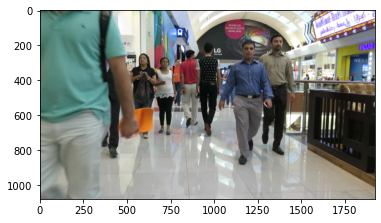

In [83]:
from matplotlib import pyplot as plt
rawsample = samples[0]
plt.imshow(plt.imread(rawsample['path']))

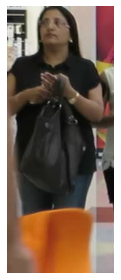

In [99]:
crop = plt.imread(rawsample['path'])[rawsample['bbb'][1]:rawsample['bbb'][3], rawsample['bbb'][0]:rawsample['bbb'][2], :]
utils.show(crop)

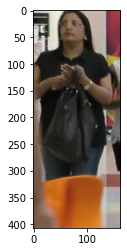

In [109]:
import torch
from torchvision import transforms
plt.imshow(transforms.ToTensor()(crop).permute(1, 2, 0).numpy())

In [2]:
from models.ours.train import create_partitions, CustomDataset

In [3]:
tr_samples, va_samples, te_samples = create_partitions(root)
tr_dset, va_dset, te_dset = CustomDataset(tr_samples), CustomDataset(va_samples), CustomDataset(te_samples)
print(len(tr_dset), len(va_dset), len(te_dset))

9 3 2


In [4]:
te_dset[0]

(tensor([[[0.1373, 0.1419, 0.1502,  ..., 0.4817, 0.4796, 0.4784],
          [0.1373, 0.1419, 0.1502,  ..., 0.4817, 0.4796, 0.4784],
          [0.1373, 0.1419, 0.1502,  ..., 0.4817, 0.4796, 0.4784],
          ...,
          [0.7159, 0.7150, 0.7134,  ..., 0.6472, 0.6451, 0.6440],
          [0.7119, 0.7116, 0.7110,  ..., 0.6492, 0.6472, 0.6460],
          [0.7098, 0.7098, 0.7098,  ..., 0.6503, 0.6482, 0.6471]],
 
         [[0.0863, 0.0874, 0.0895,  ..., 0.3954, 0.3933, 0.3922],
          [0.0863, 0.0874, 0.0895,  ..., 0.3954, 0.3933, 0.3922],
          [0.0863, 0.0874, 0.0895,  ..., 0.3954, 0.3933, 0.3922],
          ...,
          [0.7159, 0.7150, 0.7134,  ..., 0.6080, 0.6059, 0.6048],
          [0.7119, 0.7116, 0.7110,  ..., 0.6100, 0.6079, 0.6068],
          [0.7098, 0.7098, 0.7098,  ..., 0.6111, 0.6090, 0.6078]],
 
         [[0.0196, 0.0219, 0.0261,  ..., 0.1601, 0.1580, 0.1569],
          [0.0196, 0.0219, 0.0261,  ..., 0.1601, 0.1580, 0.1569],
          [0.0196, 0.0219, 0.0261,  ...,

In [5]:
from torch.utils.data import DataLoader
tr_dloader = DataLoader(tr_dset, batch_size=5, shuffle=True, num_workers=2, drop_last=False,)
va_dloader = DataLoader(va_dset, batch_size=5, shuffle=True, num_workers=2, drop_last=False)
te_dloader = DataLoader(te_dset, batch_size=5, shuffle=True, num_workers=2, drop_last=False)

dloader_dict = {'train': tr_dloader, 'valid': va_dloader}
dloader_dict

{'train': <torch.utils.data.dataloader.DataLoader at 0x7f351544d990>,
 'valid': <torch.utils.data.dataloader.DataLoader at 0x7f351544de10>}

In [6]:
for x, y in dloader_dict['train']:
    print(x.shape, y[0], y[1])

torch.Size([5, 3, 600, 200]) tensor([1, 1, 1, 1, 1]) tensor([0, 0, 0, 0, 0])
torch.Size([4, 3, 600, 200]) tensor([1, 1, 1, 1]) tensor([0, 0, 0, 0])


In [8]:
from models.ours.initial_design import BodyPredictor
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor

model = BodyPredictor()
timg = ToTensor()(plt.imread("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00004255_05_1_front.jpg"))

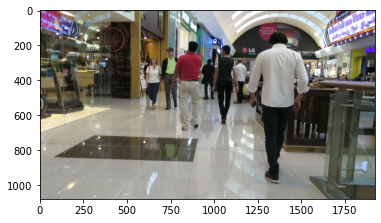

In [8]:
from matplotlib import pyplot as plt
plt.imshow(plt.imread("/home/emili/Documents/Universitat/TFG/datasets/MOT17-11/img1/000471.jpg"))

In [15]:
import argparse
parser = argparse.ArgumentParser()
parser.add_argument("--model", help="Determines which architecture will be trained.", default="baseline", choices=["baseline", "multihead"])
parser.add_argument("--pretrained", help="If flagged, use backbone pretrained on ImageNet.", action='store_true')
parser.add_argument("--cuda", help="If flagged, use cuda.", action='store_true')
args = parser.parse_args("--model baseline".split())
print(args.cuda)

False


### Transformations

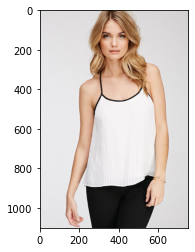

In [8]:
import cv2
import utils
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt
from models.ours.initial_design import MultiheadBodyPredictor
%matplotlib inline

path = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002499_01_1_front.jpg"
img = plt.imread(path)
plt.imshow(img)

In [6]:
timg = transforms.ToTensor()(img)
multihead = MultiheadBodyPredictor(backbone_model="resnet", backbone_size="tiny")
multihead.forward(timg.unsqueeze(0))

(tensor([[-0.1109]], grad_fn=<AddmmBackward0>),
 tensor([[0.5307]], grad_fn=<SigmoidBackward0>))

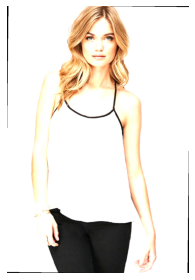

In [7]:
tform = transforms.Compose([
    transforms.ColorJitter(brightness=.5, hue=0.05),
    transforms.RandomPerspective(distortion_scale=0.15, p=0.5),
    transforms.RandomRotation(degrees=(-10, 10)),
    transforms.RandomHorizontalFlip(p=0.5)
])
utils.show(tform(timg))

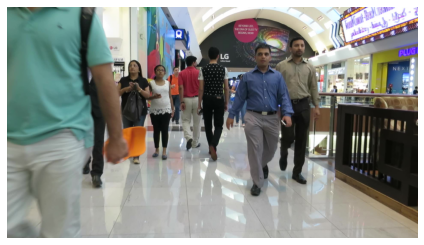

In [3]:
import json
root = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body"
samples = []
for pathset in [f"{root}/{p}/" for p in os.listdir(root)]:
    with open(pathset+"imgpaths.txt", "r") as imgpaths_file:
        imgpaths = {line.strip("\n").split("/")[-1]:line.strip("\n") for line in imgpaths_file.readlines()}
    with open(pathset+"annotations/synthetic.json", "r") as synth:
        for frame in json.load(synth):
            if frame['frame_id'] in imgpaths.keys():
                for ann in frame['annotations']:
                    samples.append({'path':imgpaths[frame['frame_id']], 'bbb':ann['bbb'], 'gender':ann['gender'], 'age':ann['age']})
samples = np.array(samples)
rawsample = samples[1]
utils.show(rawsample['path'])

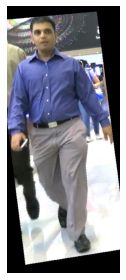

In [8]:
crop = plt.imread(rawsample['path'])[rawsample['bbb'][1]:rawsample['bbb'][3], rawsample['bbb'][0]:rawsample['bbb'][2], :]
utils.show(tform(transforms.ToTensor()(crop)))

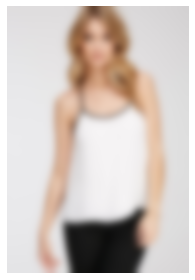

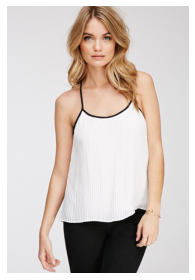

In [13]:
import cv2
import numpy as np
blurred_img = cv2.GaussianBlur(img, (101, 101), 0)
utils.show(blurred_img)
plt.show()
utils.show(img)

In [1]:
import utils
from models.baselines import deepface_multi_baseline
# utils.show(utils.draw_annotation(img, deepface_multi_baseline(img)))

In [15]:
mask = np.zeros((*img.shape[:2], 3))
for det,bbox in preds:
    mask[bbox[1]:bbox[3], bbox[0]:bbox[2], :] = 1
det.shape[0]*det.shape[1] == np.sum(mask[:,:,0])

True

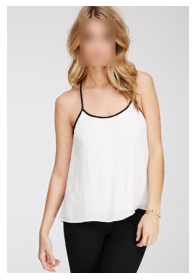

In [16]:
utils.show(np.where(mask==np.array([1, 1, 1]), blurred_img, img))

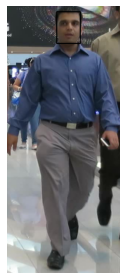

In [11]:
crop = plt.imread(rawsample['path'])[rawsample['bbb'][1]:rawsample['bbb'][3], rawsample['bbb'][0]:rawsample['bbb'][2], :]
preds = facedet.predict(crop)
utils.show(utils.draw_annotation(crop, {'bbox':preds[0][1]}))

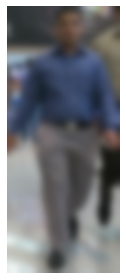

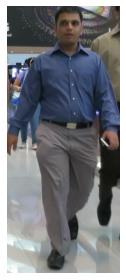

In [14]:
blurred_crop = cv2.GaussianBlur(crop, (61, 61), 0)
utils.show(blurred_crop)
plt.show()
utils.show(crop)

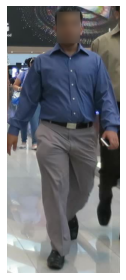

In [15]:
mask = np.zeros((*crop.shape[:2], 3))
for det,bbox in preds:
    mask[bbox[1]:bbox[3], bbox[0]:bbox[2], :] = 1
utils.show(np.where(mask==np.array([1, 1, 1]), blurred_crop, crop))

In [12]:
def blur_faces(img, kernel):
    multiple = True
    if type(img) is not list:
        multiple = False
        img = [img]
    res = []
    for im in img:
        if type(im) is str:
            im = plt.imread(im)
        assert(type(im) is np.ndarray)
        blurred_im = cv2.GaussianBlur(im, (kernel, kernel), 0)
        mask = np.zeros((*im.shape[:2], 3))
        for pred in deepface_multi_baseline(im):
            bbox = pred['bbox']
            mask[bbox[1]:bbox[3], bbox[0]:bbox[2], :] = 1
        if not multiple:
            return np.where(mask==np.array([1, 1, 1]), blurred_im, im)
        res.append(np.where(mask==np.array([1, 1, 1]), blurred_im, im))
    return res

Blurring... done.


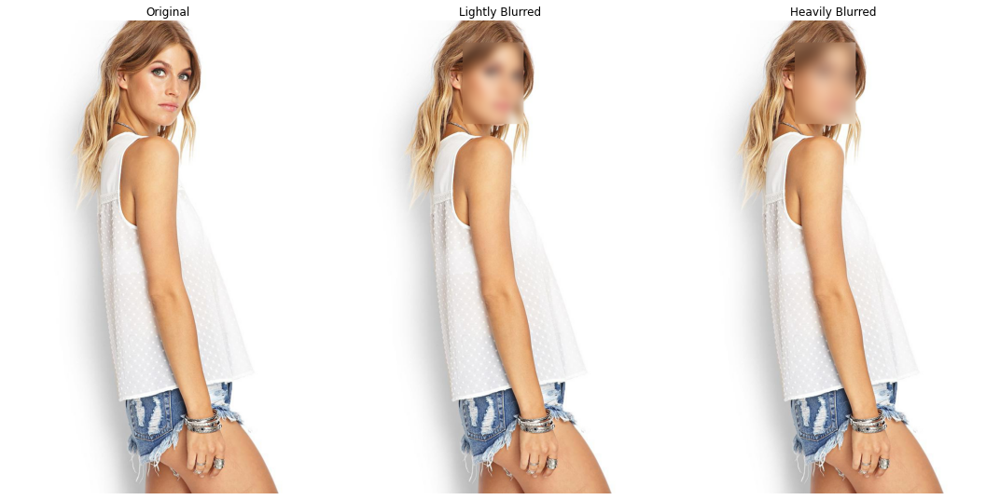

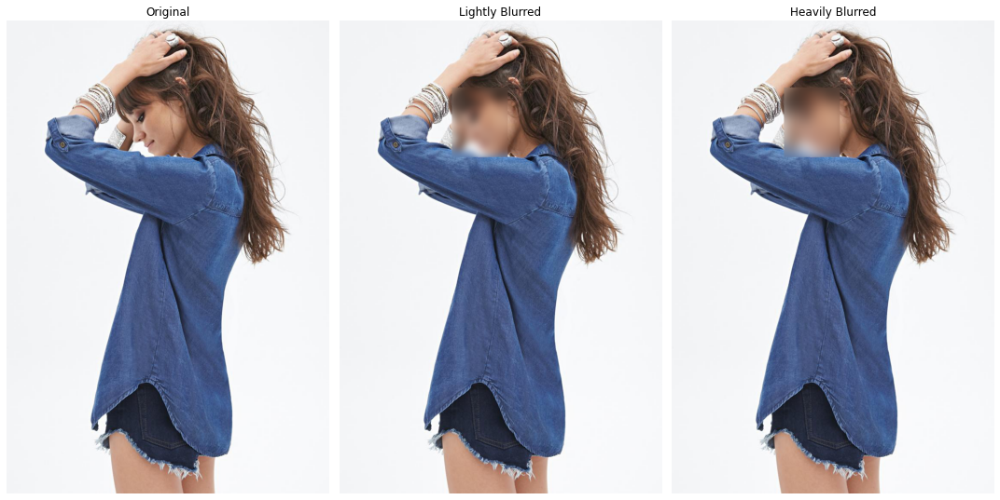

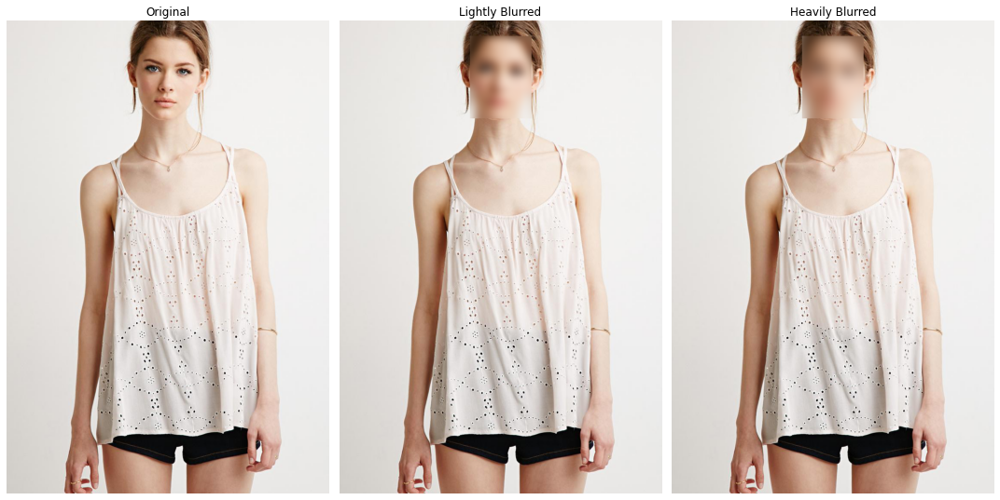

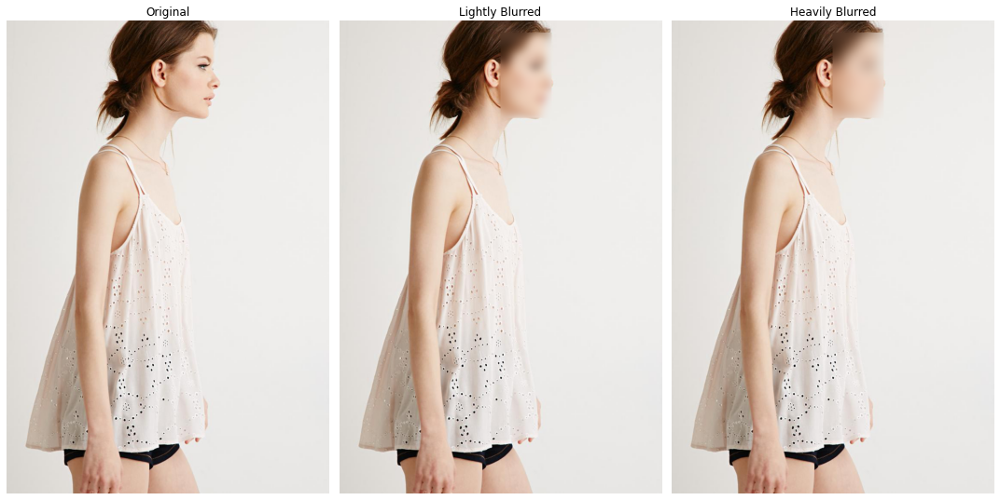

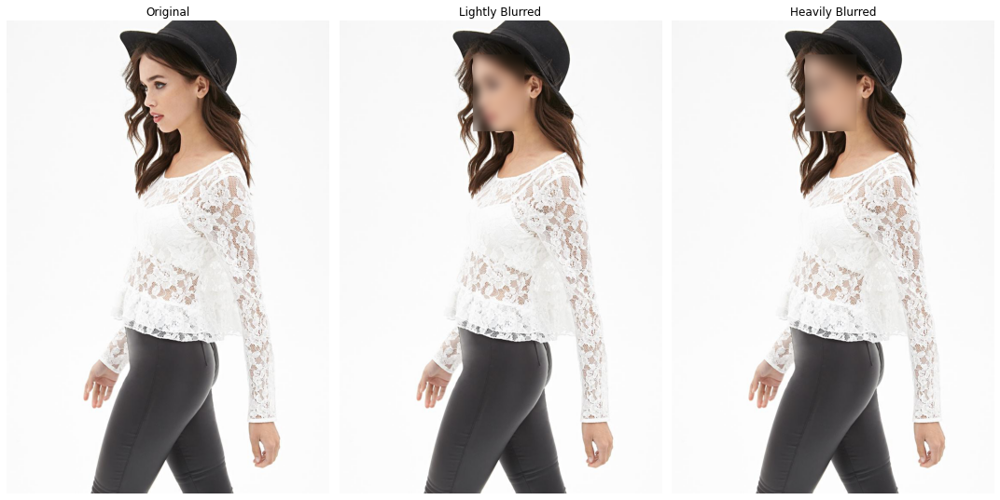

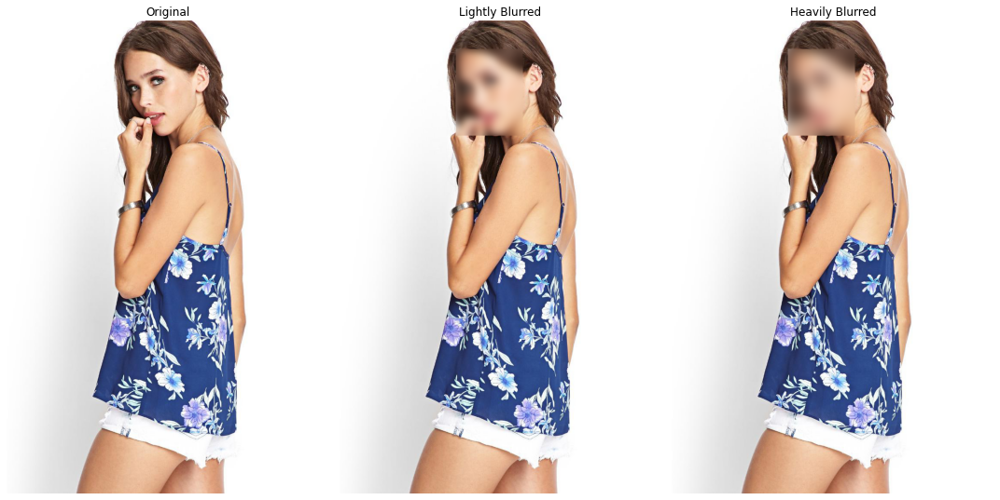

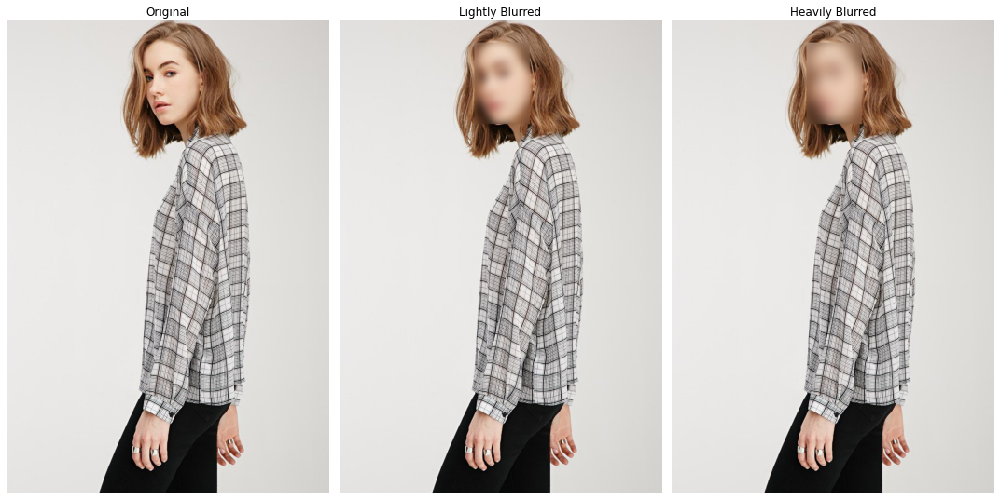

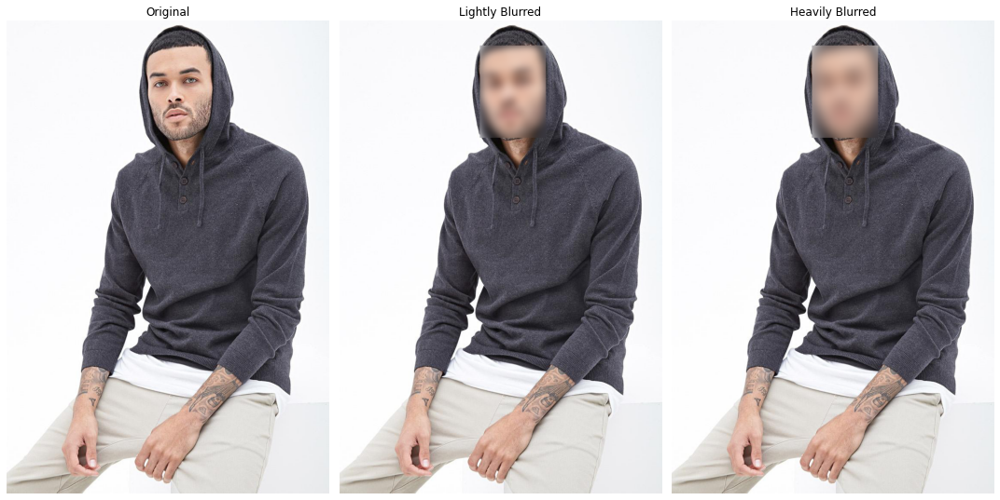

In [13]:
imgpaths = [
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002580_04_2_side.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002555_03_2_side.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002558_02_1_front.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002558_02_2_side.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002591_04_2_side.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002616_06_2_side.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002890_03_2_side.jpg",
    "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/MEN_Sweatshirts_Hoodies_id_00005444_01_1_front.jpg"
]
print("Blurring...", end=" ")
lightblur = blur_faces(imgpaths, 61)
heavyblur = blur_faces(imgpaths, 101)
print("done.")
for i,path in enumerate(imgpaths):
    fig, axs = plt.subplots(1, 3, figsize=(15,8))
    axs[0].imshow(plt.imread(path))
    axs[0].set_title("Original")
    axs[0].axis('off')
    axs[1].imshow(lightblur[i])
    axs[1].set_title("Lightly Blurred")
    axs[1].axis('off')
    axs[2].imshow(heavyblur[i])
    axs[2].set_title("Heavily Blurred")
    axs[2].axis('off')
    fig.tight_layout()
    plt.show()

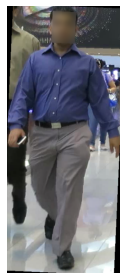

In [42]:
# Final transform combination
utils.show(tform(transforms.ToTensor()(np.where(mask==np.array([1, 1, 1]), blurred_crop, crop))))

##### Custom transformation class

In [29]:
def blur_faces(img, kernel):
    multiple = True
    if type(img) is not list:
        multiple = False
        img = [img]
    facedet = FaceDetector()
    res = []
    for im in img:
        if type(im) is str:
            im = plt.imread(im)
        istensor = False
        if type(im) is torch.Tensor:
            istensor = True
            im = im.permute(1,2,0).numpy()*255
            im = im.astype(np.uint8)
        blurred_im = cv2.GaussianBlur(im, (kernel, kernel), 0)
        mask = np.zeros((*im.shape[:2], 3))
        for _,bbox in facedet.predict(im):
            mask[bbox[1]:bbox[3], bbox[0]:bbox[2], :] = 1
        im = np.where(mask==np.array([1, 1, 1]), blurred_im, im)
        if istensor:
            im = transforms.ToTensor()(im)
        if not multiple:
            return im
        res.append(im)
    return res

class FacialBlur(object):
    def __init__(self, kernel=61, prob:float=1.0):
        self.kernel = kernel
        self.prob = prob

    def __call__(self, img):
        if type(img) is not torch.Tensor:
            raise ValueError(f"Image is of type {type(img)}; expected type {torch.Tensor}.")
        if random.uniform(0,1) < self.prob:
            return blur_faces(img, self.kernel)
        return img
    
    def __repr__(self):
        return self.__class__.__name__ + f'(kernel={self.kernel}, prob={self.prob})'

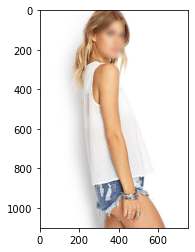

In [75]:
path = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00002580_04_2_side.jpg"
img = transforms.ToTensor()(plt.imread(path))
img = FacialBlur(kernel=61)(img)
plt.imshow(img.permute(1,2,0).numpy())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


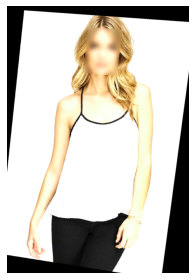

In [94]:
tform = transforms.Compose([
    FacialBlur(kernel=61),
    transforms.ColorJitter(brightness=.5, hue=0.05),
    transforms.RandomPerspective(distortion_scale=0.15, p=0.5),
    transforms.RandomRotation(degrees=(-10, 10)),
    transforms.RandomHorizontalFlip(p=0.5)
])
utils.show(tform(timg))

##### Transformations applied to custom datasets

In [1]:
import cv2
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
import numpy as np
import json
import random
from torch.utils.data import Dataset, DataLoader


def create_partitions(root:str, splits=[0.7, 0.15, 0.15], seed:int=1234):
    # Collect the samples
    samples = []
    for pathset in [f"{root}/{p}/" for p in os.listdir(root)]:
        if not os.path.exists(pathset+"annotations/synthetic.json"):
            continue
        with open(pathset+"imgpaths.txt", "r") as imgpaths_file:
            imgpaths = {line.strip("\n").split("/")[-1]:line.strip("\n") for line in imgpaths_file.readlines()}
        with open(pathset+"annotations/synthetic.json", "r") as synth:
            for frame in json.load(synth):
                if frame['frame_id'] in imgpaths.keys():
                    for ann in frame['annotations']:
                        samples.append({'path':imgpaths[frame['frame_id']], 'bbb':ann['bbb'], 'fbb':ann['fbb'], 'gender':ann['gender'], 'age':ann['age']})
    samples = np.array(samples)

    # Partition the samples
    n = len(samples)
    print(f"Total number of samples for training: {n}")
    mask = np.zeros(n, dtype=int)
    tr_limit = round(n*splits[0])
    va_limit = round(n*(splits[0]+splits[1]))
    print(f"Samples for training split: {tr_limit} ({splits[0]*100}%)")
    print(f"Samples for validation split: {va_limit-tr_limit} ({splits[1]*100}%)")
    print(f"Samples for testing split: {n-va_limit} ({splits[2]*100}%)")
    mask[tr_limit:va_limit], mask[va_limit:] = 1, 2
    random.seed(seed)
    random.shuffle(mask)
    return samples[mask==0], samples[mask==1], samples[mask==2]



class CustomDataset(Dataset):
    def __init__(self, samples, transform=None, blurprob:float=1.0, blurkernel:int=61):
        self.data = [s for s in samples if os.path.exists(s['path']) and s['bbb'] and s['gender'] and s['age']]
        self.transform = transform
        self.blurprob = blurprob
        self.blurkernel = blurkernel

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx:int):
        rawsample = self.data[idx]
        crop = plt.imread(rawsample['path'])[rawsample['bbb'][1]:rawsample['bbb'][3], rawsample['bbb'][0]:rawsample['bbb'][2], :]
        if rawsample['fbb'] is not None and random.uniform(0,1) < self.blurprob:
            blurred_crop = cv2.GaussianBlur(crop, (self.blurkernel, self.blurkernel), 0)
            newfbb = (rawsample['fbb'][0] - rawsample['bbb'][0], rawsample['fbb'][1] - rawsample['bbb'][1],
                        rawsample['fbb'][2] - rawsample['bbb'][0], rawsample['fbb'][3] - rawsample['bbb'][1])
            mask = np.zeros((*crop.shape[:2], 3))
            mask[newfbb[1]:newfbb[3], newfbb[0]:newfbb[2], :] = 1
            crop = np.where(mask==np.array([1, 1, 1]), blurred_crop, crop)
        if self.transform is None or type(transforms.ToTensor()) not in [type(t) for t in self.transform.transforms]:
            crop = transforms.ToTensor()(crop)
        assert(type(crop) is torch.Tensor)
        if self.transform is not None:
            crop = self.transform(crop)
        if self.transform is None or type(transforms.Resize(size=(0,0))) not in [type(t) for t in self.transform.transforms]:
            crop = transforms.Resize(size=(600,200))(crop)
        # Si finalment fem edat per regressió hauríem de canviar la representació aquí
        return crop, (rawsample['gender'], np.argmax(rawsample['age']))

In [2]:
root = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body"
splits = [0.7, 0.15, 0.15]

tr_samples, va_samples, te_samples = create_partitions(root)
tform = transforms.Compose([
    transforms.ColorJitter(brightness=.5, hue=0.05),
    transforms.RandomPerspective(distortion_scale=0.15, p=0.5),
    transforms.RandomRotation(degrees=(-10, 10)),
    transforms.RandomHorizontalFlip(p=0.5)
])
tr_dset, va_dset, te_dset = CustomDataset(tr_samples, transform=tform, blurprob=0.6), CustomDataset(va_samples), CustomDataset(te_samples)

Total number of samples for training: 74
Samples for training split: 52 (70.0%)
Samples for validation split: 11 (15.0%)
Samples for testing split: 11 (15.0%)


In [7]:
tform = transforms.Compose([
    FacialBlur(kernel=61),
    transforms.ColorJitter(brightness=.5, hue=0.05),
    transforms.RandomPerspective(distortion_scale=0.15, p=0.5),
    transforms.RandomRotation(degrees=(-10, 10)),
    transforms.RandomHorizontalFlip(p=0.5)
])
not tform or not type(transforms.Resize(size=(0,0))) in [type(t) for t in tform.transforms]

True

In [ ]:
import numpy as np
import json
import os
from models.ours.initial_design import bbox_pairing, extract_field


class MyTranslator:
    def __init__(self,gt_path,path_to_new_gt):
        self.gt_path = gt_path
        f = open(os.path.join(self.gt_path,'classes.json'))
        self.classes = json.load(f)
        self.dict_children = {'face':{'male':None,'female':None,'young':None,'adult':None,'elder':None},'body':{'male':None,'female':None,'young':None,'adult':None,'elder':None}}
        self.dict_parent = {'face':{'age':None,'gender':None},'body':{'age':None,'gender':None}}
        self.dict_bbox = {'face':None,'body':None}
        self.path_to_new_gt = path_to_new_gt
        self._class_labels()
        
    
    def _class_labels(self):
      
        for class_ in self.classes:
            
            self.dict_bbox[class_['name']] = class_['id']
            for att_parents in class_['attribute_groups']:
                name = att_parents['name']
                id = att_parents['id']
                self.dict_parent[class_['name']][name] = id
                for att_children in att_parents['attributes']:
                    name = att_children['name']
                    id = att_children['id']
                    self.dict_children[class_['name']][name] = id
            

    def _convert2num(self,child, parent):
        if parent == 'age':
            if child == 'young':
                child = 0
            elif child == 'adult':
                child = 1
            else:
                child = 2
        else:
            if child == 'male':
                child = 0
            else:
                child = 1
        return child

    def parse_all_gt(self):
        temp_dict = {'box':None,'gender':None,'age':None}
        final_dict = {'face':{'data':[]},'body':{'data':[]}}
        all_images_dict = {}
        for file in os.listdir(self.gt_path):
            temp_dict = {'box':None,'gender':None,'age':None}
            final_dict = {'face':{'data':[]},'body':{'data':[]}}
            if '.json' in file and file != 'classes.json':
                f = open(os.path.join(self.gt_path,file))
                loaded_json = json.load(f)
                for instance in loaded_json['instances']:
                    bbox = [instance['points']['x1'],instance['points']['y1'],instance['points']['x2'],instance['points']['y2']]
                    id = instance['classId']
                    name = list(self.dict_bbox.keys())[list(self.dict_bbox.values()).index(id)]
                    temp_dict['box'] = bbox
                    
                    for attributes in instance['attributes']:
                        child_id = attributes['id']
                        parent_id = attributes['groupId']
                       
                        child = list(self.dict_children[name].keys())[list(self.dict_children[name].values()).index(child_id)]
                        parent = list(self.dict_parent[name].keys())[list(self.dict_parent[name].values()).index(parent_id)]
                        
                        child = self._convert2num(child,parent)
                        temp_dict[parent] = child

                    final_dict[name]['data'].append(temp_dict)
                all_images_dict[file] = final_dict

        out_file = open(self.path_to_new_gt, "w")  
        json.dump(all_images_dict, out_file, indent = 4)
        out_file.close()
        for imgname in all_images_dict.keys():
            pairs = bbox_pairing(extract_field(all_images_dict[imgname]['face']['data'], "box"), extract_field(all_images_dict['000555.jpg.json']['body']['data'], "box"))
            for face_idx, body_idx in pairs:
                print(face_idx, body_idx)
                if face_idx is not None and body_idx is not None:
                    print(all_images_dict[imgname]['face']['data'][face_idx], all_images_dict[imgname]['body']['data'][body_idx])
        
        return final_dict

# params to change---------------------------------------------
path_to_superannotate_gt = '/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body/curated/MOT17-02/MOT17-02_resampled-fin'
path_to_new_gt = '/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body/curated/MOT17-02/curated_synthetic.json'
#--------------------------------------------------------------
translator = MyTranslator(path_to_superannotate_gt,path_to_new_gt)
final_dict = translator.parse_all_gt()


In [1]:
import shutil
import numpy as np
import json
import os
import utils
from models.ours.initial_design import bbox_pairing, extract_field

import matplotlib.pyplot as plt
%matplotlib inline


class MyTranslator:
    def __init__(self,gt_path,path_to_new_gt):
        self.gt_path = gt_path
        f = open(os.path.join(self.gt_path,'classes.json'))
        self.classes = json.load(f)
        self.dict_children = {'face':{'male':None,'female':None,'young':None,'adult':None,'elder':None},'body':{'male':None,'female':None,'young':None,'adult':None,'elder':None}}
        self.dict_parent = {'face':{'age':None,'gender':None},'body':{'age':None,'gender':None}}
        self.dict_bbox = {'face':None,'body':None}
        self.path_to_new_gt = path_to_new_gt
        self._class_labels()
        
    
    def _class_labels(self):
      
        for class_ in self.classes:
            
            self.dict_bbox[class_['name']] = class_['id']
            for att_parents in class_['attribute_groups']:
                name = att_parents['name']
                id = att_parents['id']
                self.dict_parent[class_['name']][name] = id
                for att_children in att_parents['attributes']:
                    name = att_children['name']
                    id = att_children['id']
                    self.dict_children[class_['name']][name] = id
            

    def _convert2num(self,child, parent):
        if parent == 'age':
            if child == 'young':
                child = 0
            elif child == 'adult':
                child = 1
            else:
                child = 2
        else:
            if child == 'male':
                child = 1
            else:
                child = 0
        return child

    def parse_all_gt(self):
        final_dict = {'face':{'data':[]},'body':{'data':[]}}
        all_images_dict = {}
        for file in os.listdir(self.gt_path):
            final_dict = {'face':{'data':[]},'body':{'data':[]}}
            if '.json' in file and file != 'classes.json':
                f = open(os.path.join(self.gt_path,file))
                loaded_json = json.load(f)
                for instance in loaded_json['instances']:
                    temp_dict = {'box':None,'gender':None,'age':None}.copy()
                    bbox = [instance['points']['x1'],instance['points']['y1'],instance['points']['x2'],instance['points']['y2']]
                    id = instance['classId']
                    name = list(self.dict_bbox.keys())[list(self.dict_bbox.values()).index(id)]
                    temp_dict['box'] = bbox
                    
                    for attributes in instance['attributes']:
                        child_id = attributes['id']
                        parent_id = attributes['groupId']
                       
                        child = list(self.dict_children[name].keys())[list(self.dict_children[name].values()).index(child_id)]
                        parent = list(self.dict_parent[name].keys())[list(self.dict_parent[name].values()).index(parent_id)]
                        
                        child = self._convert2num(child,parent)
                        temp_dict[parent] = child
                   
                    final_dict[name]['data'].append(temp_dict)
                all_images_dict[file] = final_dict
        # Continuació Emili
        anndict = {}
        count_flawed = 0
        for imgname in all_images_dict.keys():
            imgpath = os.path.join(self.gt_path, imgname.strip(".json"))
            fbb = extract_field(all_images_dict[imgname]['face']['data'], "box")
            bbb = extract_field(all_images_dict[imgname]['body']['data'], "box")
            pairs = bbox_pairing(fbb, bbb, iou_thrs=1e-3)
            for face_idx, body_idx in pairs:
                gender = age = None
                if face_idx is not None and body_idx is not None:
                    # Manage nulls and mismatches for gender labels
                    if all_images_dict[imgname]['face']['data'][face_idx]['gender'] is None:
                        if all_images_dict[imgname]['body']['data'][body_idx]['gender'] is None:  # both are none
                            count_flawed += 1
                            continue
                        else:
                            gender = all_images_dict[imgname]['body']['data'][body_idx]['gender'] # only face is none
                    elif all_images_dict[imgname]['body']['data'][body_idx]['gender'] is None:    # only body is none
                        gender = all_images_dict[imgname]['face']['data'][face_idx]['gender']
                    elif all_images_dict[imgname]['face']['data'][face_idx]['gender'] != all_images_dict[imgname]['body']['data'][body_idx]['gender']:  # both are not none, but mismatch
                        count_flawed += 1
                        continue
                    else:   # both are not none and there is no mismatch
                        gender = all_images_dict[imgname]['face']['data'][face_idx]['gender']
                    
                    # Manage nulls and mismatches for age labels
                    if all_images_dict[imgname]['face']['data'][face_idx]['age'] is None:
                        if all_images_dict[imgname]['body']['data'][body_idx]['age'] is None:
                            count_flawed += 1
                            continue
                        else:
                            age = all_images_dict[imgname]['body']['data'][body_idx]['age']
                    elif all_images_dict[imgname]['body']['data'][body_idx]['age'] is None:
                        age = all_images_dict[imgname]['face']['data'][face_idx]['age']
                    elif all_images_dict[imgname]['face']['data'][face_idx]['age'] != all_images_dict[imgname]['body']['data'][body_idx]['age']:
                        count_flawed += 1
                        continue
                    else:
                        age = all_images_dict[imgname]['face']['data'][face_idx]['age']
                elif face_idx is not None:
                    if all_images_dict[imgname]['face']['data'][face_idx]['gender'] is None or all_images_dict[imgname]['face']['data'][face_idx]['age'] is None:
                        count_flawed += 1
                        continue
                    gender = all_images_dict[imgname]['face']['data'][face_idx]['gender']
                    age = all_images_dict[imgname]['face']['data'][face_idx]['age']
                else:
                    if all_images_dict[imgname]['body']['data'][body_idx]['gender'] is None or all_images_dict[imgname]['body']['data'][body_idx]['age'] is None:
                        count_flawed += 1
                        continue
                    gender = all_images_dict[imgname]['body']['data'][body_idx]['gender']
                    age = all_images_dict[imgname]['body']['data'][body_idx]['age']
                assert(age is not None and gender is not None)
                ann = {'fbb':[round(n) for n in all_images_dict[imgname]['face']['data'][face_idx]['box']] if face_idx is not None else None,
                       'bbb':[round(n) for n in all_images_dict[imgname]['body']['data'][body_idx]['box']] if body_idx is not None else None,
                       'gender':gender,
                       'age':age}
                if imgpath not in anndict.keys():
                    anndict[imgpath] = []
                anndict[imgpath].append(ann)
        out_file = open(self.path_to_new_gt, "w")  
        json.dump(anndict, out_file, indent = 4)
        out_file.close()
        return anndict, count_flawed

In [37]:
total_count = 0
for seq in os.listdir(os.path.join(utils.root, "data/body/curated")):
    ds_name = seq.strip('_resampled-fin')
    newdir = os.path.join(utils.data,"body", ds_name)
    if os.path.exists(newdir):
        shutil.rmtree(newdir)
    os.mkdir(newdir)
    if not os.path.exists(os.path.join(newdir, "annotations")):
        os.mkdir(os.path.join(newdir, "annotations"))
    translator = MyTranslator(os.path.join(os.path.join(utils.root, "data/body/curated"), seq), os.path.join(newdir, "annotations/curated.json"))
    _, count_flawed = translator.parse_all_gt()
    total_count += count_flawed
total_count

56

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000626.jpg [{'fbb': None, 'bbb': [317, 1, 505, 481], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [0, 0, 124, 480], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [265, 111, 327, 360], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [176, 112, 254, 380], 'gender': 0, 'age': 1}]


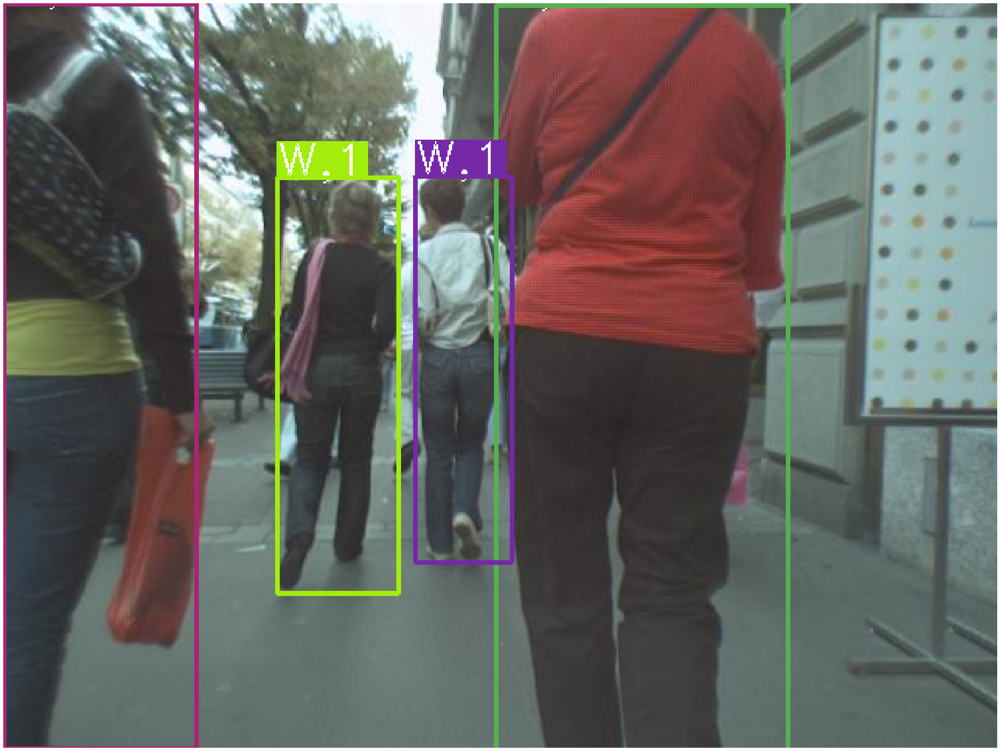

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000733.jpg [{'fbb': None, 'bbb': [66, 193, 99, 276], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [151, 84, 266, 463], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [262, 166, 306, 320], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [396, 1, 640, 480], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [325, 108, 412, 414], 'gender': 0, 'age': 2}]


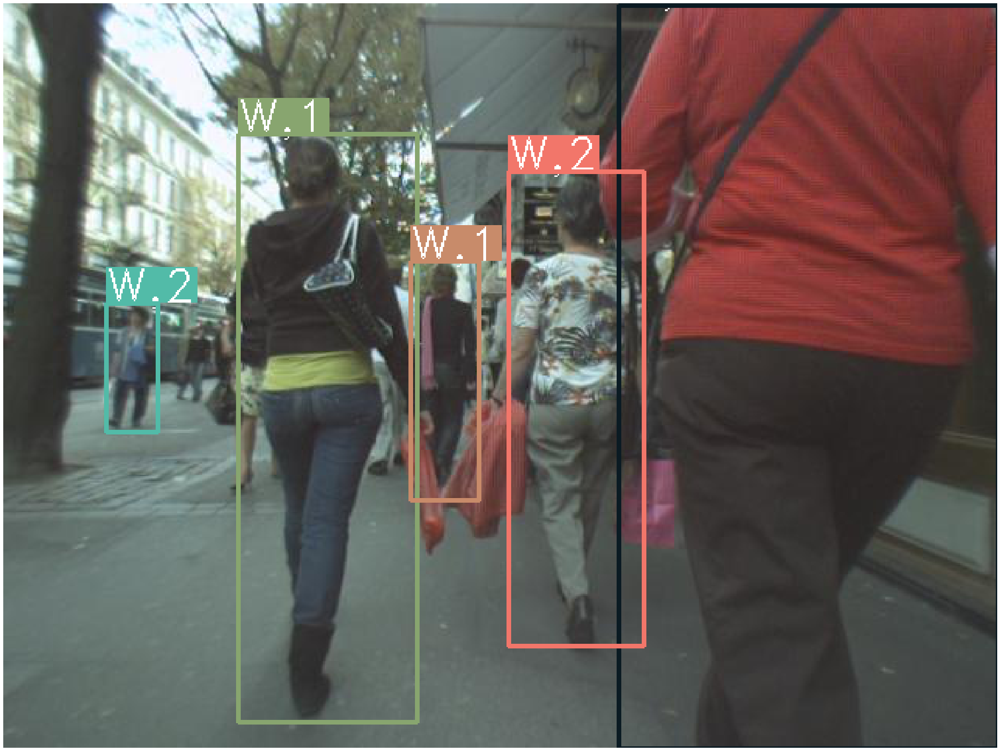

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000503.jpg [{'fbb': None, 'bbb': [473, 83, 588, 425], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [399, 89, 490, 426], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [357, 131, 403, 349], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [31, 0, 307, 480], 'gender': 0, 'age': 1}]


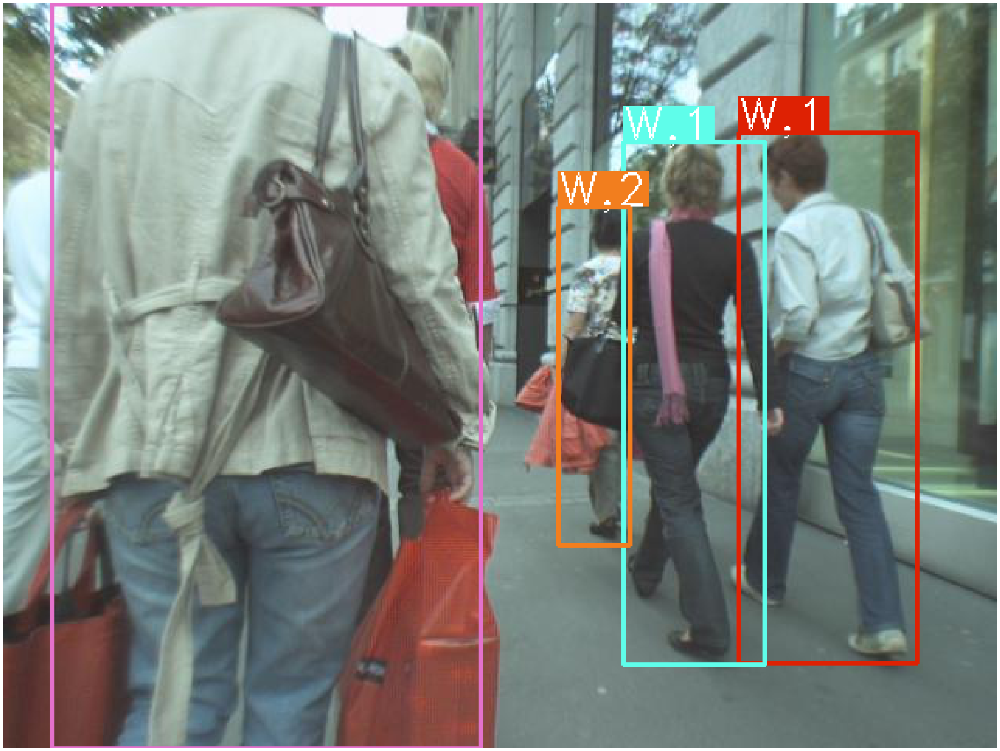

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000607.jpg [{'fbb': [140, 128, 170, 162], 'bbb': [118, 129, 193, 328], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [211, 0, 407, 480], 'gender': 0, 'age': 2}]


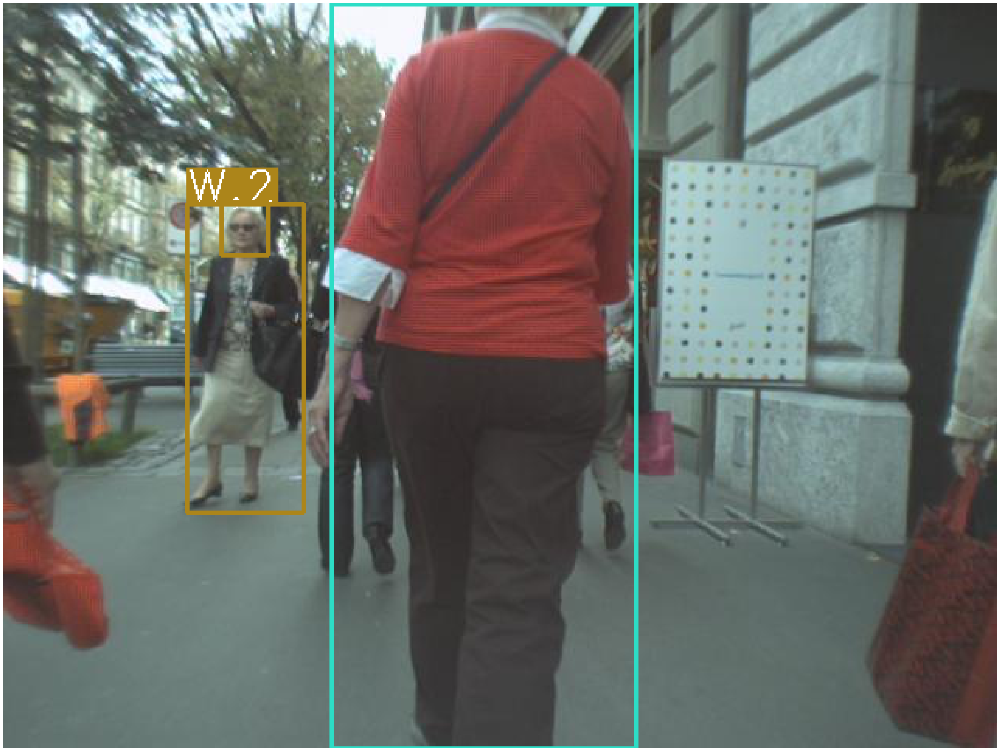

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000381.jpg [{'fbb': [538, 169, 563, 196], 'bbb': [510, 167, 578, 332], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [39, 79, 160, 397], 'gender': 1, 'age': 1}, {'fbb': None, 'bbb': [235, 166, 297, 314], 'gender': 1, 'age': 1}, {'fbb': None, 'bbb': [289, 161, 342, 318], 'gender': 1, 'age': 1}, {'fbb': None, 'bbb': [456, 195, 485, 288], 'gender': 0, 'age': 2}]


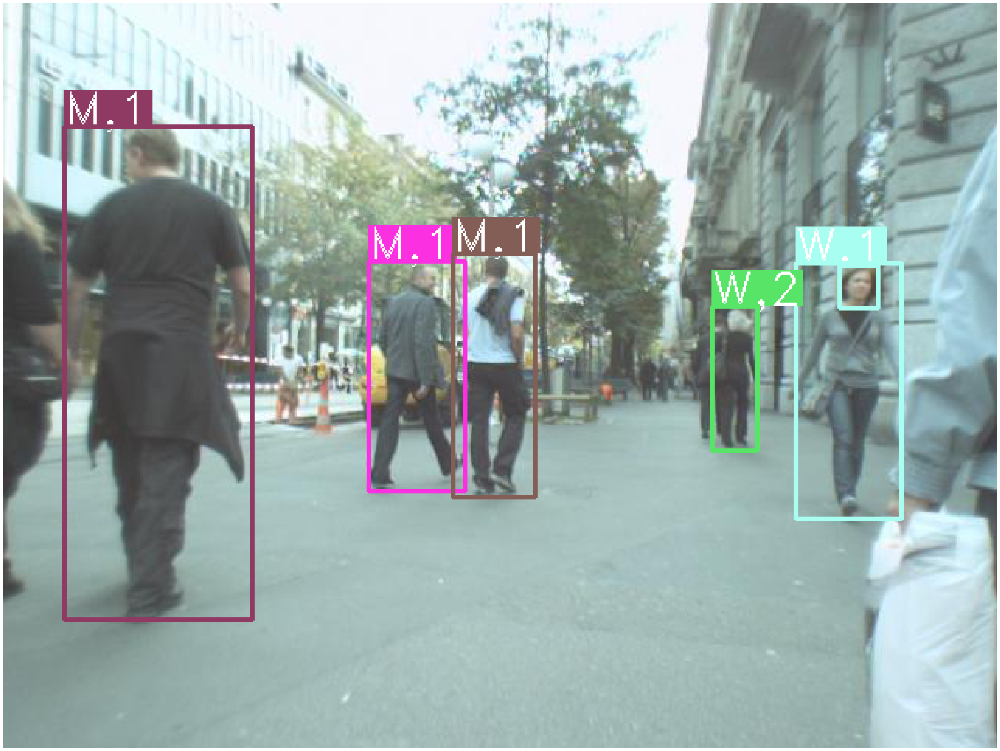

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000556.jpg [{'fbb': [196, 110, 220, 144], 'bbb': [167, 111, 238, 331], 'gender': 1, 'age': 1}, {'fbb': [63, 90, 96, 130], 'bbb': [46, 88, 124, 338], 'gender': 1, 'age': 1}, {'fbb': None, 'bbb': [559, 51, 640, 452], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [515, 118, 574, 358], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [256, 0, 444, 480], 'gender': 0, 'age': 2}]


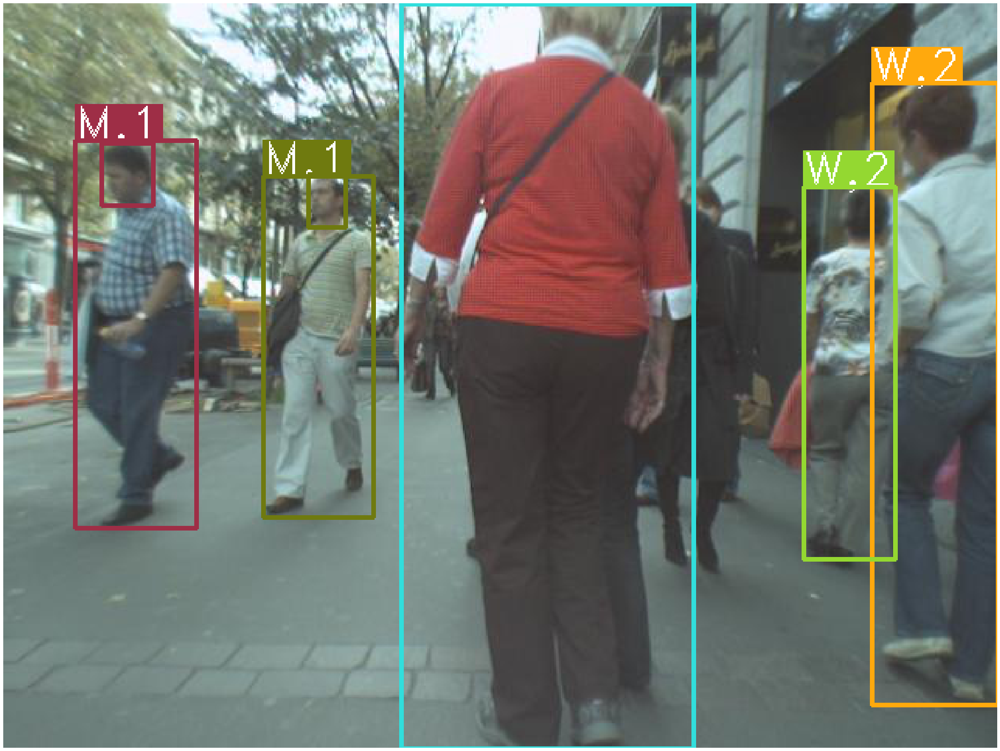

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000190.jpg [{'fbb': None, 'bbb': [0, 0, 217, 480], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [185, 11, 276, 445], 'gender': 1, 'age': 1}, {'fbb': None, 'bbb': [504, 183, 527, 274], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [313, 0, 510, 480], 'gender': 0, 'age': 2}]


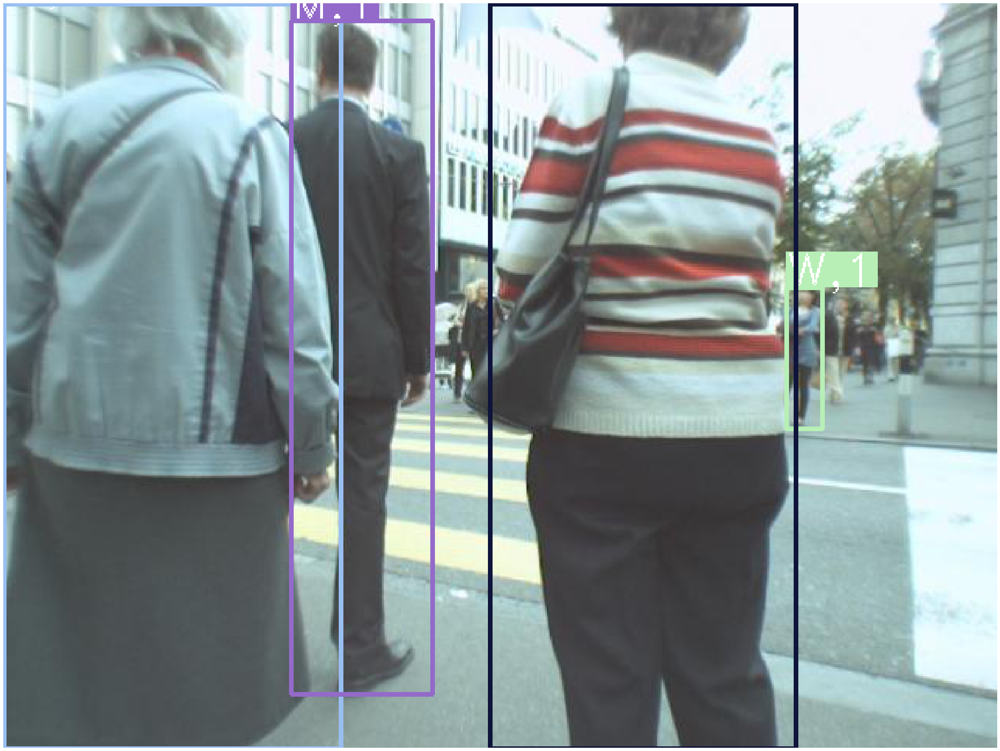

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000836.jpg [{'fbb': [115, 114, 150, 160], 'bbb': [84, 117, 166, 356], 'gender': 0, 'age': 1}, {'fbb': [240, 153, 258, 176], 'bbb': [225, 152, 274, 295], 'gender': 0, 'age': 2}, {'fbb': [178, 147, 203, 186], 'bbb': [167, 150, 222, 345], 'gender': 0, 'age': 0}, {'fbb': None, 'bbb': [388, 104, 468, 386], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [320, 125, 388, 326], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [272, 166, 312, 266], 'gender': 1, 'age': 1}]


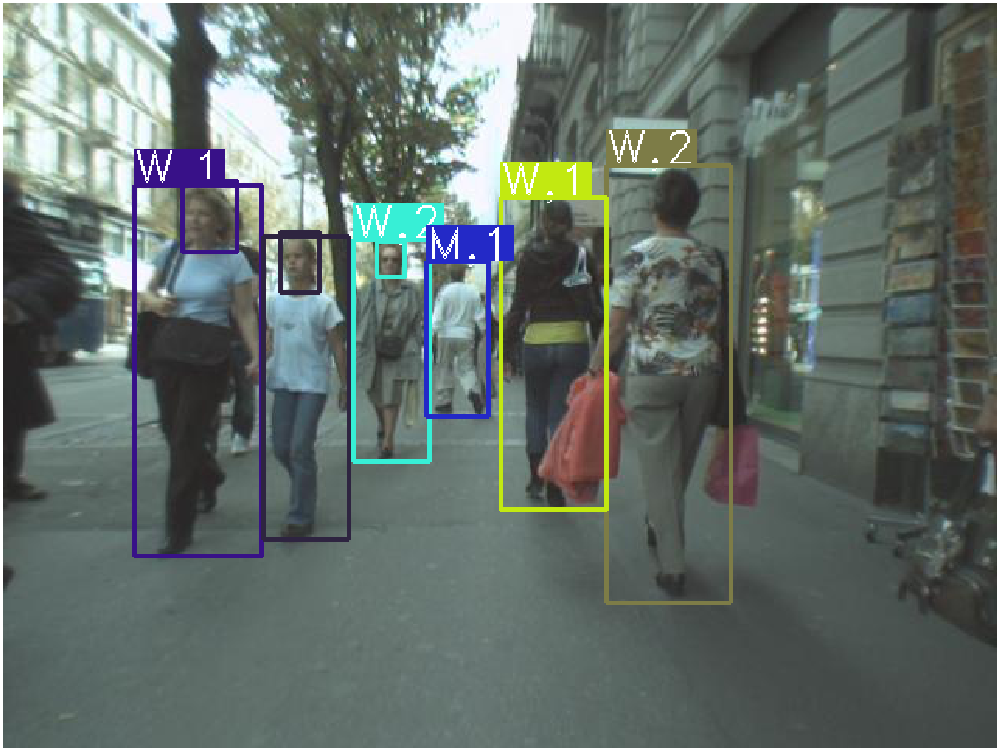

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000737.jpg [{'fbb': [128, 136, 151, 172], 'bbb': [112, 137, 162, 319], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [46, 188, 80, 274], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [151, 78, 261, 419], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [262, 168, 303, 310], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [315, 107, 405, 399], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [401, 0, 640, 480], 'gender': 0, 'age': 2}]


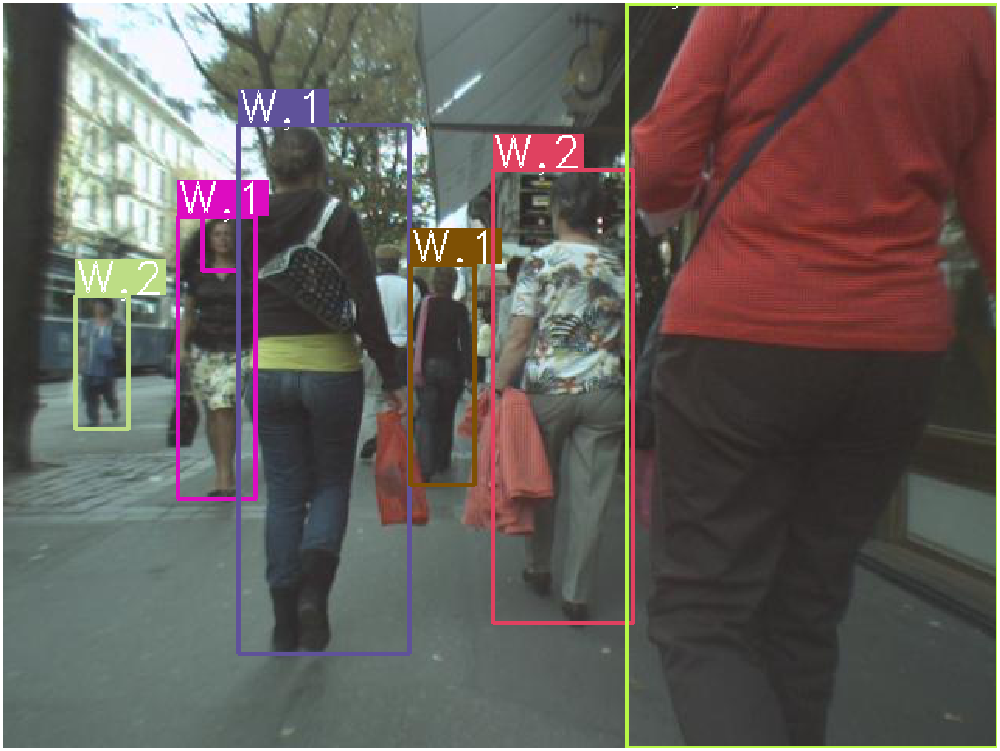

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000678.jpg [{'fbb': None, 'bbb': [112, 19, 239, 474], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [238, 138, 283, 326], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [280, 136, 339, 330], 'gender': 0, 'age': 1}, {'fbb': None, 'bbb': [380, 115, 473, 384], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [474, 0, 640, 480], 'gender': 0, 'age': 2}]


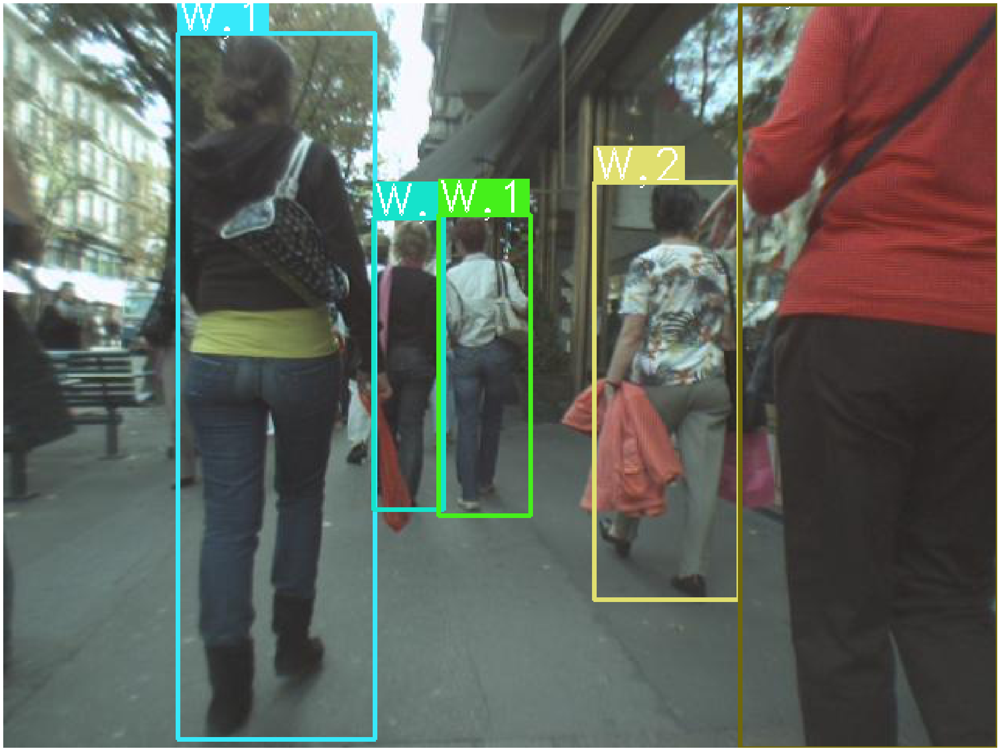

/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition//data/body/curated/MOT17-05_resampled-fin/000119.jpg [{'fbb': None, 'bbb': [307, 0, 581, 480], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [0, 0, 230, 480], 'gender': 0, 'age': 2}, {'fbb': None, 'bbb': [200, 18, 287, 431], 'gender': 1, 'age': 1}]


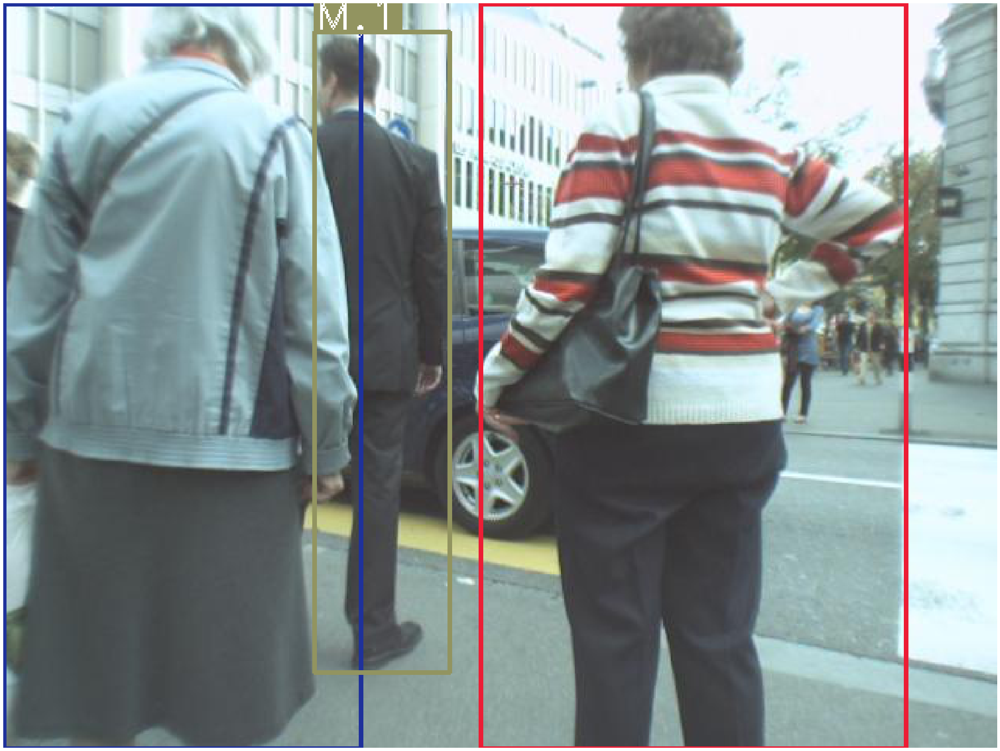

In [15]:
with open("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body/MOT17-05/annotations/curated.json", "r") as curated:
    ann = json.load(curated)
    i = 10
    for imgpath in ann:
        print(imgpath, ann[imgpath])
        anncopy = [{'fbb':sample['fbb'], 'bbb':sample['bbb'], 'gender':"Man" if sample['gender'] else "Woman", 'age':sample['age']} for sample in ann[imgpath]]
        utils.show(utils.draw_annotation(imgpath, anncopy), size=(30, 40), cformat="bgr")
        plt.show()
        if not i:
            break
        i -= 1

### Cross Validation

In [ ]:
import numpy as np
import json
from torchvision import transforms

nvalid = 2

# guardem la seqüència "MOT17-09" per testing
sequences = np.array(["MOT17-02", "MOT17-05", "MOT17-06", "MOT17-07", "MOT17-08", "MOT17-10", "MOT17-11", "MOT17-12"])
for epoch in range(3):
    print(f"Epoch {epoch+1}/3")
    for fold in range(len(sequences)//nvalid):
        train_mask = np.ones(len(sequences), dtype=bool)
        train_mask[fold*nvalid:(fold+1)*nvalid] = False
        splits = {"train": sequences[train_mask],
                  "valid": sequences[~train_mask]}
        root = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body"
        tr_samples, va_samples = [], []
        for seq in os.listdir(root):
            curated_path = os.path.join(root, seq, "annotations/curated.json")
            if (seq not in splits['train'] and seq not in splits['valid']) or not os.path.exists(curated_path):
                continue
            samples = []
            with open(curated_path) as curated:
                ann = json.load(curated)
                for imgpath in ann:
                    for sample in ann[imgpath]:
                        samples.append({'path':imgpath, 'bbb':sample['bbb'], 'fbb':sample['fbb'], 'gender':sample['gender'], 'age':sample['age']})
            if seq in splits['train']:
                tr_samples.extend(samples)
            if seq in splits['valid']:
                va_samples.extend(samples)
        ntotal = len(tr_samples) + len(va_samples)
        print('(Fold {}/{}) Split: {:.2f}% - {:.2f}%'.format(fold+1, len(sequences)//nvalid, len(tr_samples)/ntotal*100, len(va_samples)/ntotal*100, 2))
        tform = transforms.Compose([
            transforms.ColorJitter(brightness=.5, hue=0.05),
            transforms.RandomPerspective(distortion_scale=0.15, p=0.5),
            transforms.RandomRotation(degrees=(-10, 10)),
            transforms.RandomHorizontalFlip(p=0.5)
        ])
        tr_dset, va_dset = CustomDataset(tr_samples, transform=tform), CustomDataset(va_samples)
        dloaders = {'train': DataLoader(tr_dset, batch_size=5, shuffle=True, num_workers=2, drop_last=False),
                    'valid': DataLoader(va_dset, batch_size=5, shuffle=True, num_workers=2, drop_last=False)}
        for x, y in dloaders['valid']:
            print(x.shape)

In [91]:
import os
import cv2
import shutil
import json
import random
import numpy as np
import matplotlib.pyplot  as plt

import torch
from torch import optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader


class CustomDataset(Dataset):
    def __init__(self, samples, transform=None, blurprob:float=1.0, blurkernel:int=61):
        self.data = [s for s in samples if os.path.exists(s['path']) and s['bbb'] and s['gender'] and s['age']]
        self.transform = transform
        self.blurprob = blurprob
        self.blurkernel = blurkernel

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx:int):
        rawsample = self.data[idx]
        crop = plt.imread(rawsample['path'])[rawsample['bbb'][1]:rawsample['bbb'][3], rawsample['bbb'][0]:rawsample['bbb'][2], :]
        if rawsample['fbb'] is not None and random.uniform(0,1) < self.blurprob:
            blurred_crop = cv2.GaussianBlur(crop, (self.blurkernel, self.blurkernel), 0)
            newfbb = (rawsample['fbb'][0] - rawsample['bbb'][0], rawsample['fbb'][1] - rawsample['bbb'][1],
                        rawsample['fbb'][2] - rawsample['bbb'][0], rawsample['fbb'][3] - rawsample['bbb'][1])
            mask = np.zeros((*crop.shape[:2], 3))
            mask[newfbb[1]:newfbb[3], newfbb[0]:newfbb[2], :] = 1
            crop = np.where(mask==np.array([1, 1, 1]), blurred_crop, crop)
        if self.transform is None or type(transforms.ToTensor()) not in [type(t) for t in self.transform.transforms]:
            crop = transforms.ToTensor()(crop)
        assert(type(crop) is torch.Tensor)
        if self.transform is not None:
            crop = self.transform(crop)
        if self.transform is None or type(transforms.Resize(size=(0,0))) not in [type(t) for t in self.transform.transforms]:
            crop = transforms.Resize(size=(600,200))(crop)
        return crop, (rawsample['gender'], np.argmax(rawsample['age']))


def blur_faces(img, kernel:int=61):
    multiple = True
    if type(img) is not list:
        multiple = False
        img = [img]
    facedet = FaceDetector()
    res = []
    for im in img:
        if type(im) is str:
            im = plt.imread(im)
        istensor = False
        if type(im) is torch.Tensor:
            istensor = True
            im = im.permute(1,2,0).numpy()*255
            im = im.astype(np.uint8)
        blurred_im = cv2.GaussianBlur(im, (kernel, kernel), 0)
        mask = np.zeros((*im.shape[:2], 3))
        for _,bbox in facedet.predict(im):
            mask[bbox[1]:bbox[3], bbox[0]:bbox[2], :] = 1
        im = np.where(mask==np.array([1, 1, 1]), blurred_im, im)
        if istensor:
            im = transforms.ToTensor()(im)
        if not multiple:
            return im
        res.append(im)
    return res

class FacialBlur(object):
    def __init__(self, kernel:int=61, prob:float=1.0):
        self.kernel = kernel
        self.prob = prob

    def __call__(self, img):
        if type(img) is not torch.Tensor:
            raise ValueError(f"Image is of type {type(img)}; expected type {torch.Tensor}.")
        if random.uniform(0,1) < self.prob:
            return blur_faces(img, self.kernel)
        return img
    
    def __repr__(self):
        return self.__class__.__name__ + f'(kernel={self.kernel}, prob={self.prob})'

In [8]:
import numpy as np
sequences = np.array(["MOT17-02", "MOT17-05", "MOT17-06", "MOT17-07", "MOT17-08", "MOT17-09", "MOT17-10", "MOT17-11", "MOT17-12"])
for epoch in range(3):
    print(f"Epoch {epoch+1}/3")
    nvalid = 2
    for fold in range(len(sequences)//nvalid):
        train_mask = np.ones(len(sequences), dtype=bool)
        train_mask[fold*nvalid:(fold+1)*nvalid] = False
        print(train_mask)

Epoch 1/3
[False False  True  True  True  True  True  True  True]
[ True  True False False  True  True  True  True  True]
[ True  True  True  True False False  True  True  True]
[ True  True  True  True  True  True False False  True]
Epoch 2/3
[False False  True  True  True  True  True  True  True]
[ True  True False False  True  True  True  True  True]
[ True  True  True  True False False  True  True  True]
[ True  True  True  True  True  True False False  True]
Epoch 3/3
[False False  True  True  True  True  True  True  True]
[ True  True False False  True  True  True  True  True]
[ True  True  True  True False False  True  True  True]
[ True  True  True  True  True  True False False  True]


In [2]:
from torchvision import models
npar_convnext_tiny = sum(p.numel() for p in models.convnext_tiny().parameters() if p.requires_grad)
npar_convnext_tiny

28589128

In [4]:
npar_resnet50 = sum(p.numel() for p in models.resnet50().parameters() if p.requires_grad)
npar_resnet50

25557032

In [7]:
npar_convnext_base = sum(p.numel() for p in models.convnext_base().parameters() if p.requires_grad)
npar_convnext_base

88591464

In [12]:
npar_resnet101 = sum(p.numel() for p in models.resnet101().parameters() if p.requires_grad)
npar_resnet101

44549160

In [11]:
npar_convnext_small = sum(p.numel() for p in models.convnext_small().parameters() if p.requires_grad)
npar_convnext_small

50223688

# Testing

In [2]:
import torch
from models.ours.initial_design import BaselineBodyPredictor, MultiheadBodyPredictor

In [2]:
baseline = BaselineBodyPredictor(backbone_size="tiny")
baseline.inference(["MOT17-09"], prints=True)

(Testing) Total: 750


100%|██████████| 43/43 [01:27<00:00,  2.03s/it]

[tests] GLoss: 0.0061, GAcc: 0.0092, ALoss: 0.6968, AAcc: 0.9862


{'gender_acc': 0.009174311926605505,
 'gender_loss': 0.0061297739873033595,
 'age_acc': 0.9862385321100917,
 'age_loss': 0.6968001173723728}

In [18]:
multihead = MultiheadBodyPredictor(backbone_size="tiny")
multihead.inference(["MOT17-09"], prints=True)

(Testing) Total: 750


100%|██████████| 43/43 [00:27<00:00,  1.54it/s]

[tests] GLoss: 0.0458, GAcc: 0.0000, ALoss: 0.8018, AAcc: 0.9862


{'gender_acc': 0.0,
 'gender_loss': 0.04582481920172315,
 'age_acc': 0.9862385321100917,
 'age_loss': 0.8018189285873273}

In [14]:
ocp = torch.load("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/trained_models/body/state_dict.pth", map_location=torch.device('cpu'))
multihead = MultiheadBodyPredictor(backbone_size="tiny")
multihead.load_state_dict(ocp['model_state_dict'])
multihead.eval()
multihead.inference(["MOT17-09"], prints=True)

(Testing) Total: 750


100%|██████████| 43/43 [00:26<00:00,  1.63it/s]

[tests] GLoss: 0.0001, GAcc: 0.9862, ALoss: 0.0022, AAcc: 0.9862


{'gender_acc': 0.9862385321100917,
 'gender_loss': 9.52405382723146e-05,
 'age_acc': 0.9862385321100917,
 'age_loss': 0.002183096051865488}

In [6]:
ocp = torch.load("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/trained_models/body/multihead_state_dict.pth", map_location=torch.device('cpu'))
multihead = MultiheadBodyPredictor(backbone_size="tiny")
multihead.load_state_dict(ocp['model_state_dict'])
multihead.eval()
multihead.inference(["MOT17-09"], prints=True)

(Testing) Total: 750


100%|██████████| 43/43 [00:23<00:00,  1.82it/s]

[tests] GLoss: 0.0016, GAcc: 0.9862, ALoss: 0.0091, AAcc: 0.9862


{'gender_acc': 0.9862385321100917,
 'gender_loss': 0.001642527277666836,
 'age_acc': 0.9862385321100917,
 'age_loss': 0.009083839607587374}

In [3]:
import utils
import matplotlib.pyplot as plt
from torchvision.transforms import ToTensor
from models.ours.initial_design import BodyDetector
%matplotlib inline
imgpath = "/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00006213_01_2_side.jpg"

In [19]:
def test(imgpath):
    bbox = BodyDetector().predict(ToTensor()(plt.imread(imgpath)))[0]
    utils.show(utils.draw_annotation(imgpath, {'bbox':bbox}), cformat="bgr")
    plt.show()
    detection = plt.imread(imgpath)[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    utils.show(detection)
    multihead = MultiheadBodyPredictor(backbone_size="tiny")
    ocp = torch.load("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/trained_models/body/state_dict_segon.pth", map_location=torch.device('cpu'))
    multihead.load_state_dict(ocp['model_state_dict'])
    multihead.eval()
    return multihead.forward(ToTensor()(detection).unsqueeze(0))

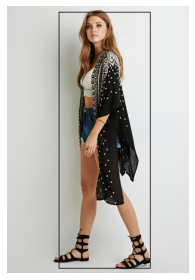

(tensor([[-6.1147e-05]], grad_fn=<AddmmBackward0>),
 tensor([[0.9953]], grad_fn=<SigmoidBackward0>))

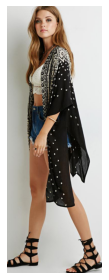

In [7]:
test("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/WOMEN_Blouses_Shirts_id_00003540_02_2_side.jpg")

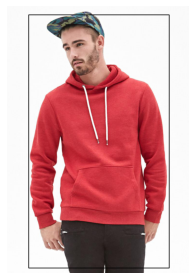

(tensor([[-5.7299e-05]], grad_fn=<AddmmBackward0>),
 tensor([[0.9953]], grad_fn=<SigmoidBackward0>))

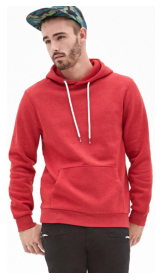

In [8]:
test("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/MEN_Sweatshirts_Hoodies_id_00005799_08_1_front.jpg")

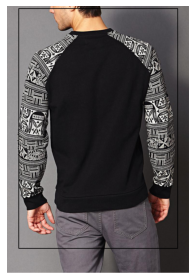

(tensor([[-5.2046e-05]], grad_fn=<AddmmBackward0>),
 tensor([[0.9953]], grad_fn=<SigmoidBackward0>))

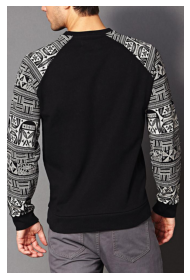

In [9]:
test("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/mmfashion_sample_images/MEN_Sweatshirts_Hoodies_id_00003064_02_3_back.jpg")

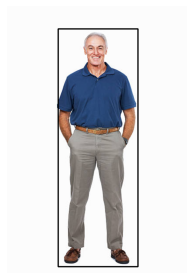

(tensor([[-0.0002]], grad_fn=<AddmmBackward0>),
 tensor([[0.9955]], grad_fn=<SigmoidBackward0>))

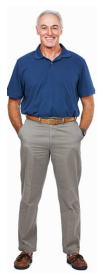

In [10]:
test("/home/emili/Baixades/brossa/istockphoto-184089713-612x612.jpg")

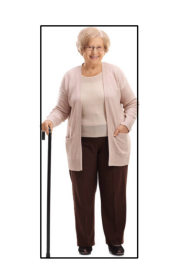

(tensor([[-0.0001]], grad_fn=<AddmmBackward0>),
 tensor([[0.9955]], grad_fn=<SigmoidBackward0>))

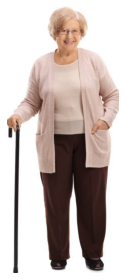

In [11]:
test("/home/emili/Baixades/brossa/istockphoto-648841078-612x612.jpg")

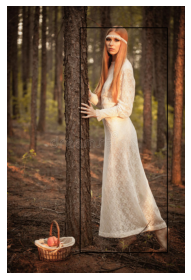

(tensor([[-2.9568e-05]], grad_fn=<AddmmBackward0>),
 tensor([[0.9954]], grad_fn=<SigmoidBackward0>))

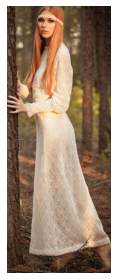

In [13]:
test("/home/emili/Baixades/brossa/woman_forest.jpg")

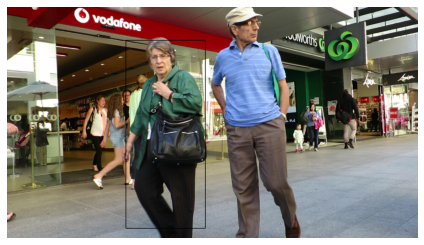

(tensor([[-6.0074e-05]], grad_fn=<AddmmBackward0>),
 tensor([[0.9954]], grad_fn=<SigmoidBackward0>))

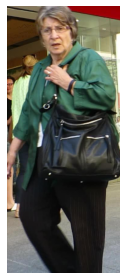

In [5]:
def test(imgpath):
    bbox = BodyDetector().predict(ToTensor()(plt.imread(imgpath)))[2]
    utils.show(utils.draw_annotation(imgpath, {'bbox':bbox}), cformat="bgr")
    plt.show()
    detection = plt.imread(imgpath)[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    utils.show(detection)
    multihead = MultiheadBodyPredictor(backbone_size="tiny")
    ocp = torch.load("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/trained_models/body/multihead_state_dict.pth", map_location=torch.device('cpu'))
    multihead.load_state_dict(ocp['model_state_dict'])
    multihead.eval()
    return multihead.forward(ToTensor()(detection).unsqueeze(0))
test("/home/emili/Documents/Universitat/TFG/cv-gender-age-recognition/data/body/curated/MOT17-09_resampled-fin/000174.jpg")

# Unbiassing weights

In [ ]:
root = os.getcwd().split("cv-gender-age-recognition")[0]+"cv-gender-age-recognition/data/body"
samples = []
for seq in os.listdir(root):
    curated_path = os.path.join(root, seq, 'annotations/curated.json')
    if seq not in sequences or not os.path.exists(curated_path):
        continue
    with open(curated_path) as curated:
        ann = json.load(curated)
        for imgpath in ann:
            for sample in ann[imgpath]:
                samples.append({'path':imgpath, 'bbb':sample['bbb'], 'fbb':sample['fbb'], 'gender':sample['gender'], 'age':sample['age']})
print(f'(Testing) Total: {len(samples)}') if prints else None
dloader = DataLoader(CustomDataset(samples), batch_size=5, shuffle=True, num_workers=2, drop_last=True)

# Run inference
accum_gender_loss = accum_gender_acc = accum_age_loss = accum_age_acc = 0
gender_loss_fn, age_loss_fn = nn.BCELoss(), nn.MSELoss()
device, nbins = torch.device("cuda:0") if next(self.parameters()).is_cuda else torch.device("cpu"), 3
self.eval()
for x, y in tqdm(dloader, disable=not prints):
    x, y = x.to(device), [label.to(device) for label in y]
    aout, gout = self.forward(x)
    aloss, gloss = age_loss_fn(aout.squeeze(1), y[1].to(torch.float)), gender_loss_fn(gout.squeeze(1), y[0].to(torch.float))

    accum_age_loss += gloss.item() * x.size(0)
    accum_gender_loss += aloss.item() * x.size(0)
    gpreds = torch.round(gout).detach()
    accum_gender_acc += torch.sum(gpreds == y[0].unsqueeze(1)).item()
    apreds = torch.round(aout).detach()
    apreds[apreds > nbins-1], apreds[apreds < 0] = nbins-1, 0
    accum_age_acc += torch.sum(apreds == y[1].unsqueeze(1)).item()
    n = len(dloader.dataset)
    gender_acc, gender_loss = accum_gender_acc/n, accum_gender_loss/n
    age_acc, age_loss = accum_age_acc/n, accum_age_loss/n
    if prints:
        print('[tests] GLoss: {:.4f}, GAcc: {:.4f}, ALoss: {:.4f}, AAcc: {:.4f}'.format(
            gender_loss, gender_acc, age_loss, age_acc))
    return {'gender_acc':gender_acc, 'gender_loss':gender_loss, 'age_acc':age_acc, 'age_loss':age_loss}

In [2]:
from torchvision import models
print(sum(p.numel() for p in models.efficientnet_b0(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b1(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b2(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b3(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b4(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b5(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b6(pretrained=False).parameters()))
print(sum(p.numel() for p in models.efficientnet_b7(pretrained=False).parameters()))

5288548
7794184
9109994
12233232
19341616
30389784
43040704
66347960


In [3]:
print(sum(p.numel() for p in models.convnext_tiny(pretrained=False).parameters()))
print(sum(p.numel() for p in models.convnext_small(pretrained=False).parameters()))
print(sum(p.numel() for p in models.convnext_base(pretrained=False).parameters()))
print(sum(p.numel() for p in models.convnext_large(pretrained=False).parameters()))

28589128
50223688
88591464
197767336
